In [1]:
import numpy as np
import tensorflow as tf
from keras import layers
from PIL import Image
from IPython.display import display
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import classification_report
from keras.preprocessing.image import ImageDataGenerator
import os
from keras.models import Model
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt


In [2]:
target_image_size = (75, 75)
model_name = ''
num_classes = 17

In [3]:
# model = load_model('model.h5')
model = tf.keras.models.load_model("model.h5", compile=False)
model.compile("adam", "categorical_crossentropy",
                  metrics=["accuracy"])

In [4]:
# 載入測試集資料
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        'Dataset_3Devices/test',
        target_size=target_image_size,
        batch_size=32,
        class_mode='categorical',
        shuffle=False)

# 預測測試集圖片的類別
preds = model.predict(test_generator)

# 將預測結果轉換為類別標籤
predicted_classes = np.argmax(preds, axis=1)

# 取得類別名稱列表
class_names = list(test_generator.class_indices.keys())

loss, acc = model.evaluate(test_generator)

Found 510 images belonging to 17 classes.
16/16 [==============================] - 2s 34ms/step - loss: 0.2284 - accuracy: 0.9373


In [5]:
from sklearn.metrics import classification_report

# 將預測結果轉換為類別標籤
predicted_labels = np.argmax(preds, axis=1)

# 取得真實類別標籤和類別名稱
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# 生成每個類別的精確度、召回率、F1-score和支持度等指標
report = classification_report(true_labels, predicted_labels, target_names=class_names)

# 輸出報告
print(report)

              precision    recall  f1-score   support

         1-1       1.00      1.00      1.00        30
         1-2       1.00      1.00      1.00        30
         2-1       1.00      1.00      1.00        30
         2-2       0.83      1.00      0.91        30
         3-1       0.89      0.80      0.84        30
         3-2       0.87      0.87      0.87        30
         4-1       1.00      0.97      0.98        30
         4-2       0.69      0.97      0.81        30
         5-1       1.00      0.83      0.91        30
         5-2       0.95      0.70      0.81        30
         6-1       1.00      0.90      0.95        30
         6-2       1.00      1.00      1.00        30
         6-3       1.00      1.00      1.00        30
         7-1       0.97      0.93      0.95        30
         8-1       0.91      0.97      0.94        30
         8-2       1.00      1.00      1.00        30
         8-3       0.97      1.00      0.98        30

    accuracy              

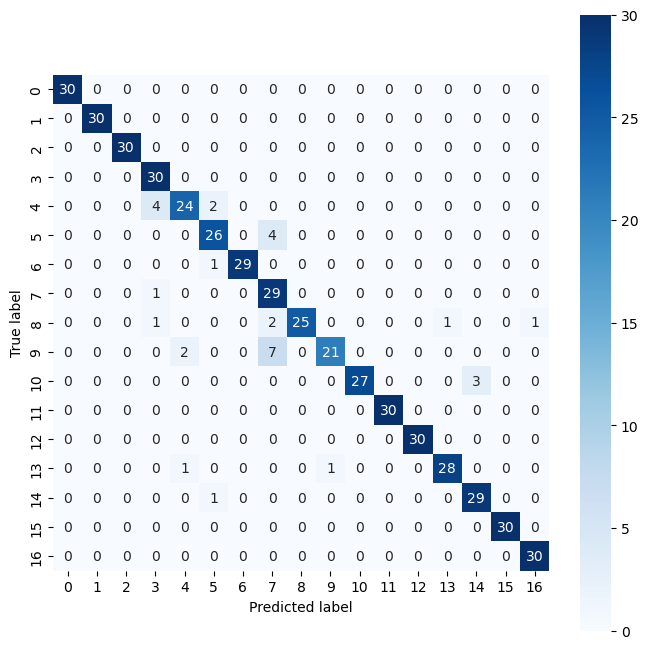

In [6]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# 取得真實類別標籤
true_classes = test_generator.classes

# 產生混淆矩陣
cm = confusion_matrix(true_classes, predicted_classes)

# 顯示混淆矩陣
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

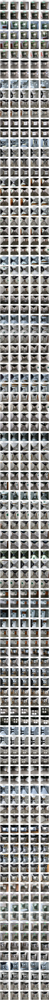

In [7]:
# 顯示預測結果
num_images = len(test_generator.filepaths)
num_cols = 5  # 每行顯示5張圖片
num_rows = int(np.ceil(num_images / num_cols))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows*4))
for i, img_path in enumerate(test_generator.filepaths):
    row_idx = i // num_cols
    col_idx = i % num_cols

    # 讀取圖片並顯示
    img = Image.open(img_path)
    axs[row_idx, col_idx].imshow(img)

    # 取得圖片的實際標籤
    # folder = img_path.split('\\')[1]
    folder = os.path.basename(os.path.dirname(img_path))

    label = folder

    # 取得預測標籤
    predicted_label = class_names[predicted_classes[i]]

    # 設定標題
    title = f'Predicted: {predicted_label}\nActual: {label}'
    axs[row_idx, col_idx].set_title(title)

    # 設定坐標軸不顯示
    axs[row_idx, col_idx].axis('off')

plt.show()


In [7]:
# 顯示預測結果
for i, img_path in enumerate(test_generator.filepaths):

    folder = os.path.basename(os.path.dirname(img_path))

    label = folder
    print("預測:", class_names[predicted_classes[i]], " - 實際:", label , end='')
    if(class_names[predicted_classes[i]] == label):
        print(' 正確')
    else:
        print(' 錯誤')

預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-1  - 實際: 1-1 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  - 實際: 1-2 正確
預測: 1-2  -